# Procesamiento de Señales de Audio en Música

In [31]:
import pandas as pd
import numpy as np
import numpy, scipy, matplotlib.pyplot as plt, IPython.display as ipd, sklearn
import os
import matplotlib.pyplot as plt
%matplotlib inline
from random import randint
import librosa
import librosa.display
import IPython.display as ipd
from IPython.display  import Audio
from sklearn import preprocessing
import seaborn as sns
import missingno as msno

In [32]:
cancion_rock = "./data/BohemianRhapsody_Rock.mp3"
samples, sr = librosa.load(cancion_rock, sr = None, mono = True, offset = 0.0, duration = None)

In [3]:
Audio(cancion_rock)

## Representación gráfica de la señal de audio

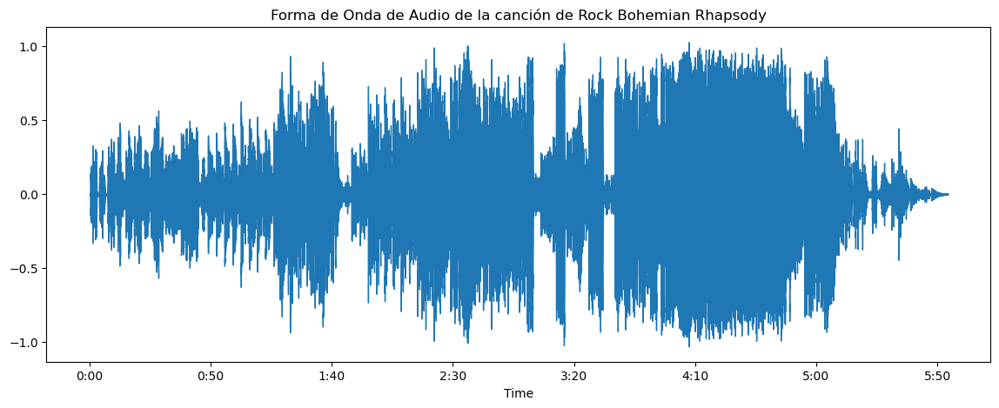

In [33]:
plt.figure(figsize=(14, 5))
librosa.display.waveshow(samples, sr=sr)
plt.title("Forma de Onda de Audio de la canción de Rock Bohemian Rhapsody")
plt.show()

## Espectrograma de la Canción de Rock

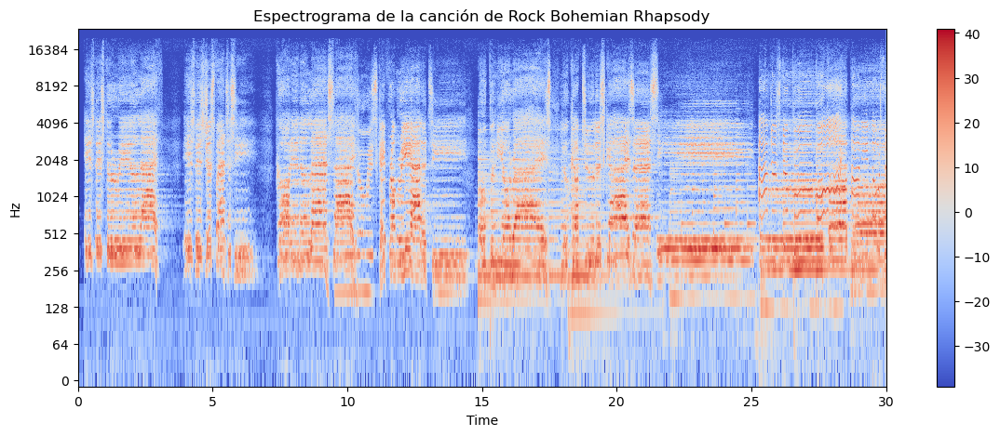

In [35]:
#Dividir la señal en segmentos de 30 segundos
segment_duration = 30  # segundos
samples_segmented = samples[:segment_duration * sr]  # Recortar la señal a la duración deseada

# Inicializa una matriz vacía para almacenar los espectrogramas de cada segmento
spectrograms = []

# Itera a través de los segmentos y calcula el espectrograma para cada uno
for i in range(0, len(samples_segmented), segment_duration * sr):
    segment = samples_segmented[i:i + segment_duration * sr]
    X = librosa.stft(segment)
    Xdb = librosa.amplitude_to_db(np.abs(X))
    spectrograms.append(Xdb)

# Combina los espectrogramas en una representación global
global_spectrogram = np.concatenate(spectrograms, axis=1)

# Crea una figura y muestra el espectrograma global
plt.figure(figsize=(14, 5))
librosa.display.specshow(global_spectrogram, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()
plt.title("Espectrograma de la canción de Rock Bohemian Rhapsody")

# Muestra la figura
plt.show()

## Selección de características

### Cero crossing rate

Text(0.5, 1.0, 'Canción Rock')

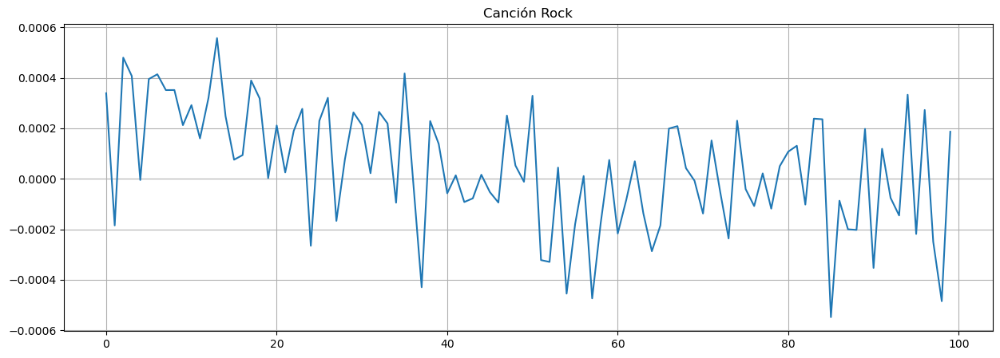

In [36]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(15, 5))
plt.plot(samples[n0:n1])
plt.grid()
plt.title("Canción Rock")

Para calcular la cantidad exacta de cruces con 0

In [37]:
# Para calcular la cantidad de cruces con 0
zero_crossings= librosa.zero_crossings(samples[n0:n1], pad=False)
print(np.mean(zero_crossings))
print(sum(zero_crossings))

0.5
50


### Spectral cendroid

In [38]:
#spectral centroid, calcula el crentoide espectral para cada cuadro de la señal
spectral_centroids = librosa.feature.spectral_centroid(y=samples, sr=sr)[0]
spectral_centroids.shape

(33222,)

### Spectral Roll Off

In [45]:
# Calcula el "spectral roll-off" con librosa
spectral_rolloff = librosa.feature.spectral_rolloff(y=samples, sr=sr)[0]

print(f"Spectral Roll-off: {spectral_rolloff[0]} Hz")

Spectral Roll-off: 16453.125 Hz


In [46]:
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

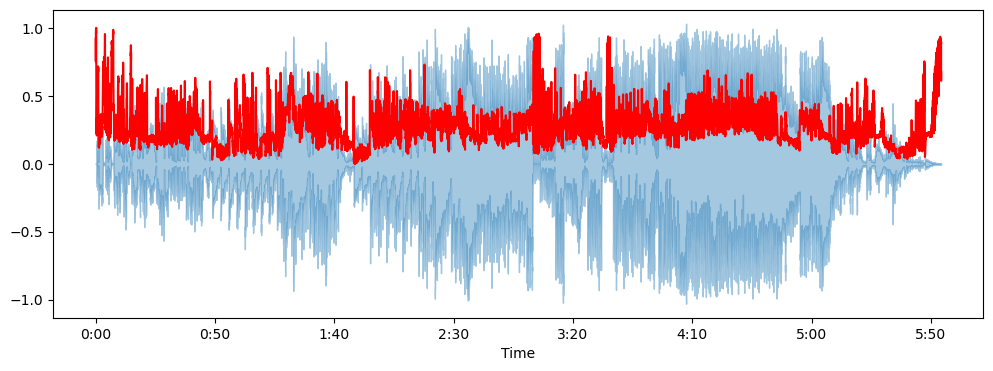

In [47]:
plt.figure(figsize=(12, 4))
librosa.display.waveshow(samples, sr=sr, alpha=0.4)
plt.plot(time, normalize(spectral_rolloff), color='r')

### Cepstrum de Frecuencia Mel

In [48]:
# Calcular los MFCC
mfcc = librosa.feature.mfcc(y=samples, sr=sr, n_mfcc=13, hop_length=512, n_fft=2048)

# Calcular el Cepstrum de Frecuencia Mel
mel_cepstrum = np.mean(mfcc, axis=1)

# Imprimir los primeros coeficientes del Cepstrum de Frecuencia Mel
print("Cepstrum de Frecuencia Mel:")
print(mel_cepstrum)

Cepstrum de Frecuencia Mel:
[-202.22174     146.92119     -30.499424     33.58239       0.7873336
   10.808667     -8.07584       4.231593      5.019819     -5.1705666
   -0.62312645    2.1246405    -1.8333174 ]


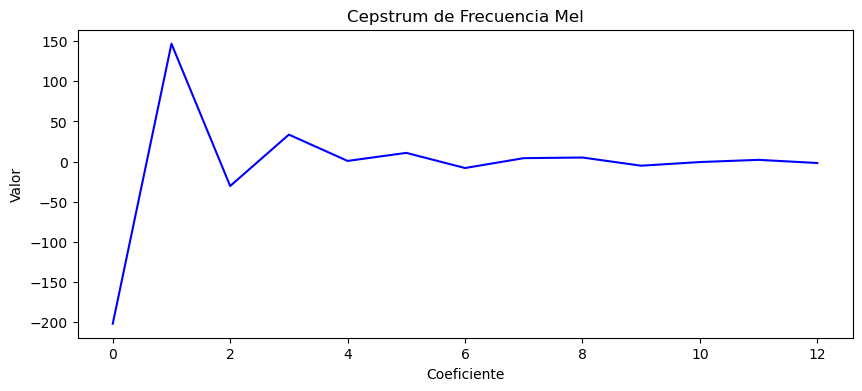

In [49]:
# Crear un vector de tiempo para el eje x
time = np.arange(0, mel_cepstrum.shape[0])

# Graficar el Cepstrum de Frecuencia Mel
plt.figure(figsize=(10, 4))
plt.plot(time, mel_cepstrum, color='b')
plt.title('Cepstrum de Frecuencia Mel')
plt.xlabel('Coeficiente')
plt.ylabel('Valor')
plt.show()